In [2]:
file_content = ""
with open('pg244.txt', 'r', encoding='utf-8') as file:
    file_content = file.read()

We're begining by cutting out project gutrenberg header and footer and then we split the book into documents, each chapter on its own<br>
We also remove first few documents as they are only from the contents section 

In [21]:
import re
documents = re.split("CHAPTER [A-Z]+\.", file_content.split("***")[2])[15:]
documents

['\nMR. SHERLOCK HOLMES.\n\n\nIn the year 1878 I took my degree of Doctor of Medicine of the\nUniversity of London, and proceeded to Netley to go through the course\nprescribed for surgeons in the army. Having completed my studies there,\nI was duly attached to the Fifth Northumberland Fusiliers as Assistant\nSurgeon. The regiment was stationed in India at the time, and before I\ncould join it, the second Afghan war had broken out. On landing at\nBombay, I learned that my corps had advanced through the passes, and\nwas already deep in the enemy’s country. I followed, however, with many\nother officers who were in the same situation as myself, and succeeded\nin reaching Candahar in safety, where I found my regiment, and at once\nentered upon my new duties.\n\nThe campaign brought honours and promotion to many, but for me it had\nnothing but misfortune and disaster. I was removed from my brigade and\nattached to the Berkshires, with whom I served at the fatal battle of\nMaiwand. There I 

Now we can split each document into list of words while turning all letters to lower case and removing all puncuations

In [94]:
chapter_words = []
for doc in documents:
    doc = re.sub('(\W|_)', ' ', doc)
    chapter_words.append(doc.lower().split())

print(chapter_words)

[['mr', 'sherlock', 'holmes', 'in', 'the', 'year', '1878', 'i', 'took', 'my', 'degree', 'of', 'doctor', 'of', 'medicine', 'of', 'the', 'university', 'of', 'london', 'and', 'proceeded', 'to', 'netley', 'to', 'go', 'through', 'the', 'course', 'prescribed', 'for', 'surgeons', 'in', 'the', 'army', 'having', 'completed', 'my', 'studies', 'there', 'i', 'was', 'duly', 'attached', 'to', 'the', 'fifth', 'northumberland', 'fusiliers', 'as', 'assistant', 'surgeon', 'the', 'regiment', 'was', 'stationed', 'in', 'india', 'at', 'the', 'time', 'and', 'before', 'i', 'could', 'join', 'it', 'the', 'second', 'afghan', 'war', 'had', 'broken', 'out', 'on', 'landing', 'at', 'bombay', 'i', 'learned', 'that', 'my', 'corps', 'had', 'advanced', 'through', 'the', 'passes', 'and', 'was', 'already', 'deep', 'in', 'the', 'enemy', 's', 'country', 'i', 'followed', 'however', 'with', 'many', 'other', 'officers', 'who', 'were', 'in', 'the', 'same', 'situation', 'as', 'myself', 'and', 'succeeded', 'in', 'reaching', 'cand

Now that the we have a all lists of all words we should filter stop words out of it

In [95]:
stop_words = set()
with open('stop_words.txt', 'r', encoding='utf-8') as file:
    file_content = file.read()
    stop_words = set(file_content.splitlines())

filtered_chapter_words = [[word for word in words if word not in stop_words] for words in chapter_words]
print(filtered_chapter_words)

[['mr', 'sherlock', 'holmes', 'year', '1878', 'took', 'degree', 'doctor', 'medicine', 'university', 'london', 'proceeded', 'netley', 'go', 'course', 'prescribed', 'surgeons', 'army', 'completed', 'studies', 'duly', 'attached', 'fifth', 'northumberland', 'fusiliers', 'assistant', 'surgeon', 'regiment', 'stationed', 'india', 'time', 'could', 'join', 'second', 'afghan', 'war', 'broken', 'landing', 'bombay', 'learned', 'corps', 'advanced', 'passes', 'already', 'deep', 'enemy', 'country', 'followed', 'however', 'many', 'officers', 'situation', 'succeeded', 'reaching', 'candahar', 'safety', 'found', 'regiment', 'entered', 'upon', 'new', 'duties', 'campaign', 'brought', 'honours', 'promotion', 'many', 'nothing', 'misfortune', 'disaster', 'removed', 'brigade', 'attached', 'berkshires', 'served', 'fatal', 'battle', 'maiwand', 'struck', 'shoulder', 'jezail', 'bullet', 'shattered', 'bone', 'grazed', 'subclavian', 'artery', 'fallen', 'hands', 'murderous', 'ghazis', 'devotion', 'courage', 'shown', 

We also can filter out different forms of the same word<br>
But I decided not to as it was filtering out main word "Holmes" and turning into "holm"

In [96]:
# from stemming.porter2 import stem
# filtered_words = [ stem ( word ) for word in filtered_words ]


Next step is to count weight of each individual word in each document and sort descending<br>

The weight of the word is calculated by the formula $weight(word, document, book) = tf\text{-}ifd(word, document, book) = tf(word, document) \times idf(word, book)$

Whis formula calculates frequency of the word in its document ($tf$) but also divides it by its popularity in other documents so ($idf$ function). This means that if a word is popular across the whole book its weight will not be as big as for a word that is frequent in only this one chapter

In [ ]:
documents_pairs = []

def tf(word, document):
    return document.count(word)

def idf(word, book):
    import math
    num_documents_with_word = sum(1 for doc in book if word in doc)
    return math.log(len(book) / (1 + num_documents_with_word))

for words in filtered_chapter_words:
    words_weight = []
    for word in words:
        if word not in [w for w, _ in words_weight]:
            words_weight.append((word, tf(word, words) * idf(word, filtered_chapter_words)))
    words_weight.sort(key=lambda x: x[1], reverse=True)
    documents_pairs.append(words_weight)


documents_pairs


[[('test', 17.51319134149782),
  ('stamford', 15.40445040947149),
  ('stains', 13.621371043387192),
  ('hospital', 7.783640596221253),
  ('rooms', 7.516577810972208),
  ('medical', 6.161780163788596),
  ('delighted', 5.8377304471659395),
  ('student', 5.8377304471659395),
  ('laboratory', 5.011051873981472),
  ('studies', 4.621335122841447),
  ('chemical', 4.621335122841447),
  ('afghanistan', 4.621335122841447),
  ('regiment', 3.8918202981106265),
  ('bringing', 3.8918202981106265),
  ('enthusiasm', 3.8918202981106265),
  ('holborn', 3.8918202981106265),
  ('halves', 3.8918202981106265),
  ('prefer', 3.8918202981106265),
  ('beating', 3.8918202981106265),
  ('subjects', 3.8918202981106265),
  ('precipitated', 3.8918202981106265),
  ('hæmoglobin', 3.8918202981106265),
  ('resulting', 3.8918202981106265),
  ('beautiful', 3.8918202981106265),
  ('rows', 3.8918202981106265),
  ('noon', 3.8918202981106265),
  ('mine', 3.758288905486104),
  ('bye', 3.758288905486104),
  ('hotel', 3.38919144

Now whats left is only to save this words in a wordcloud which is made using wordcloud library 

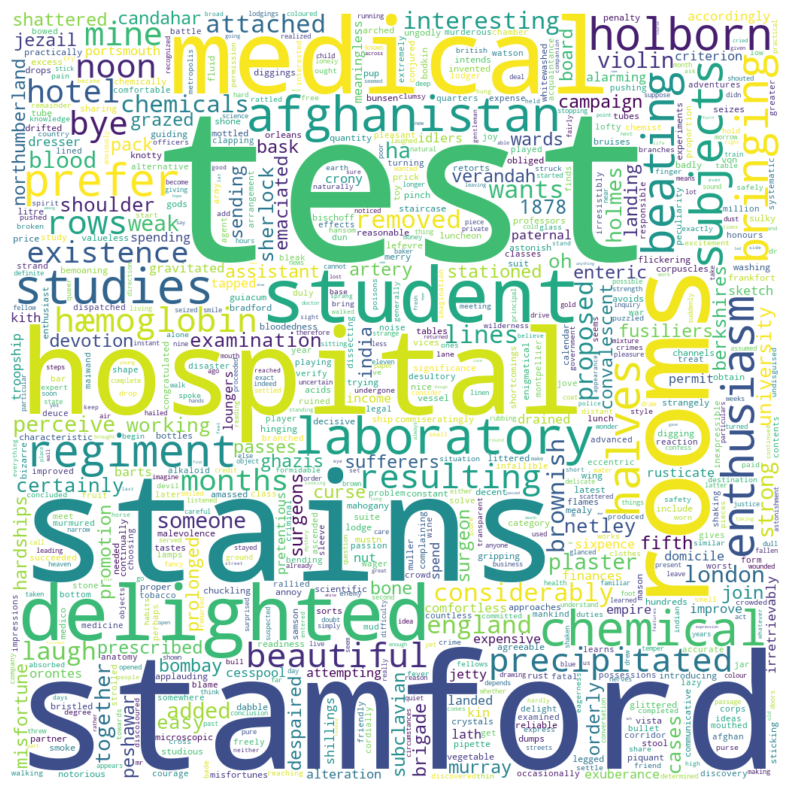

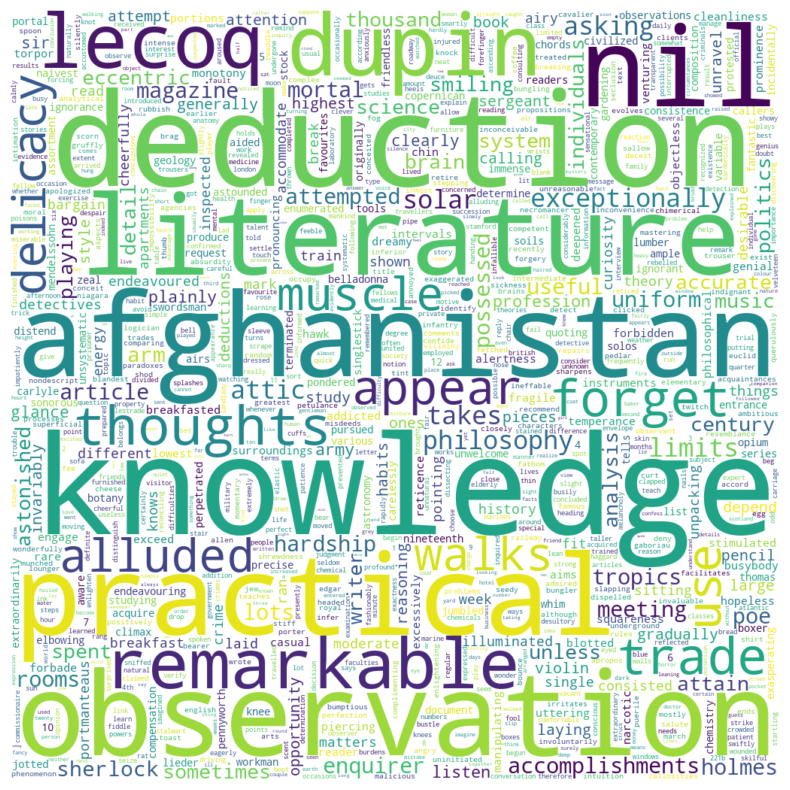

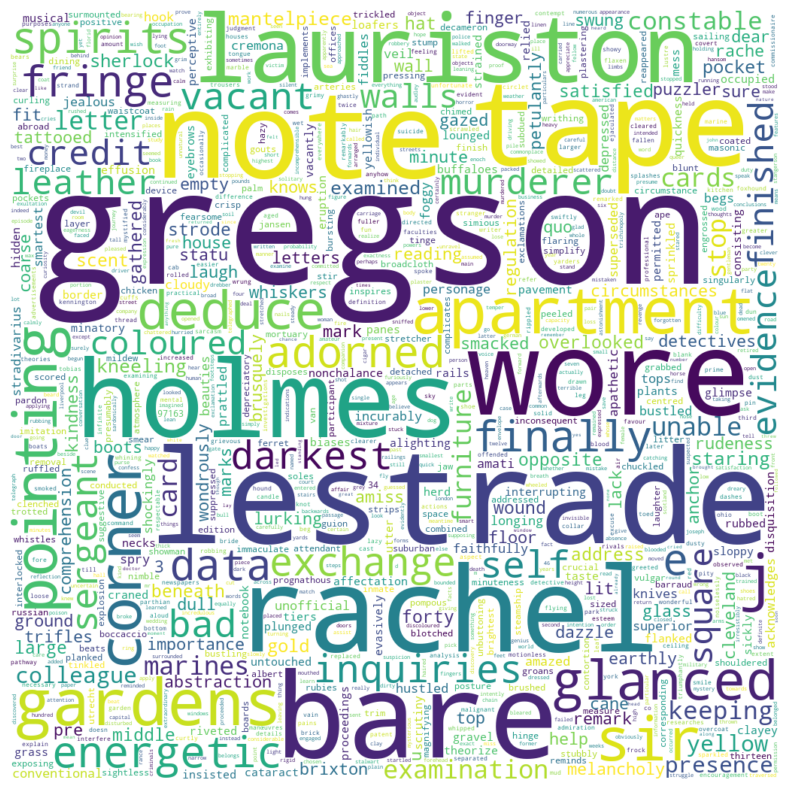

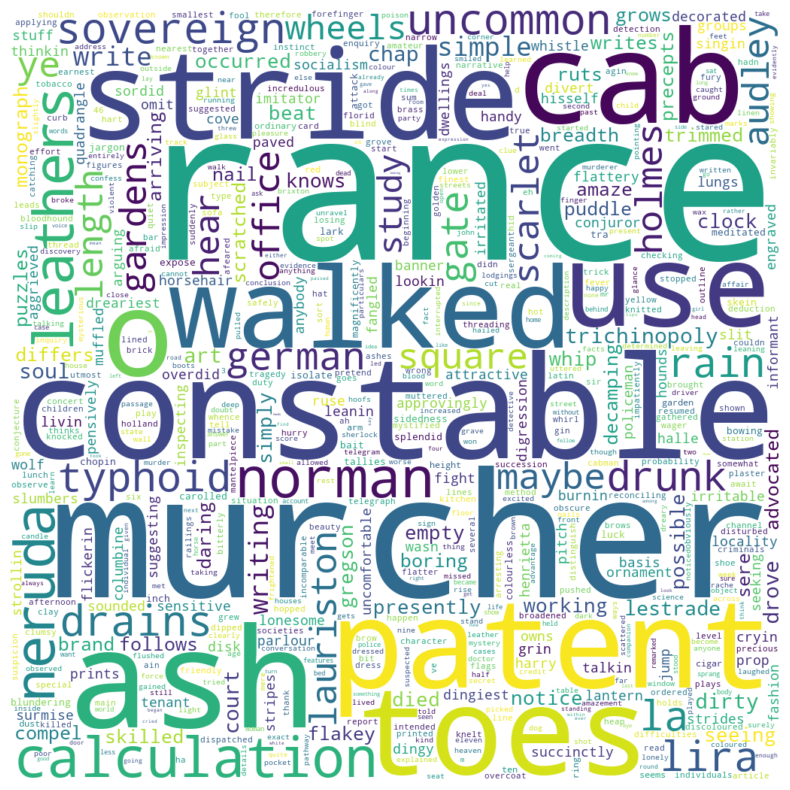

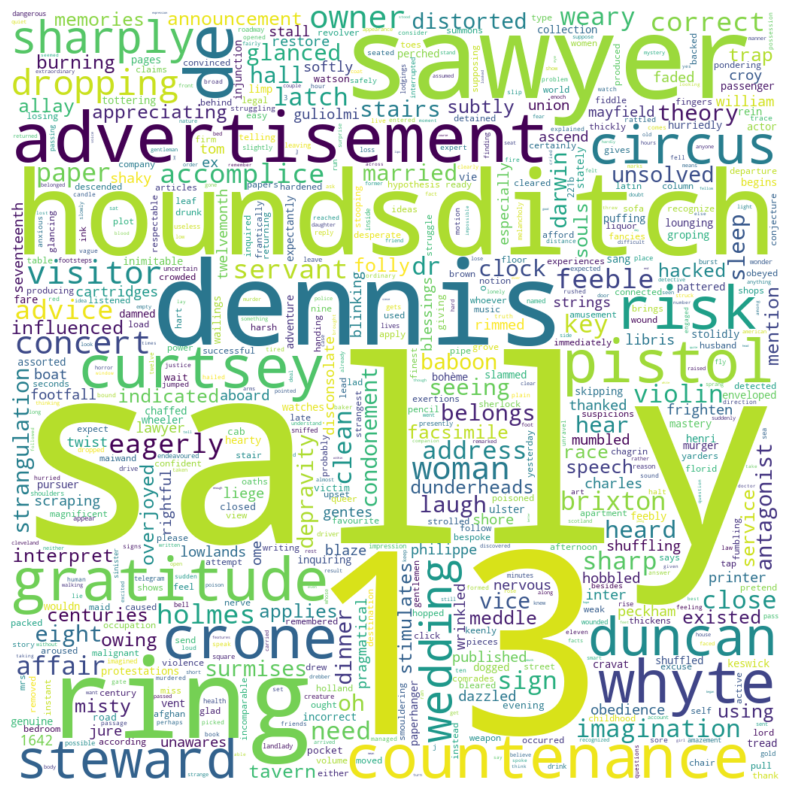

...

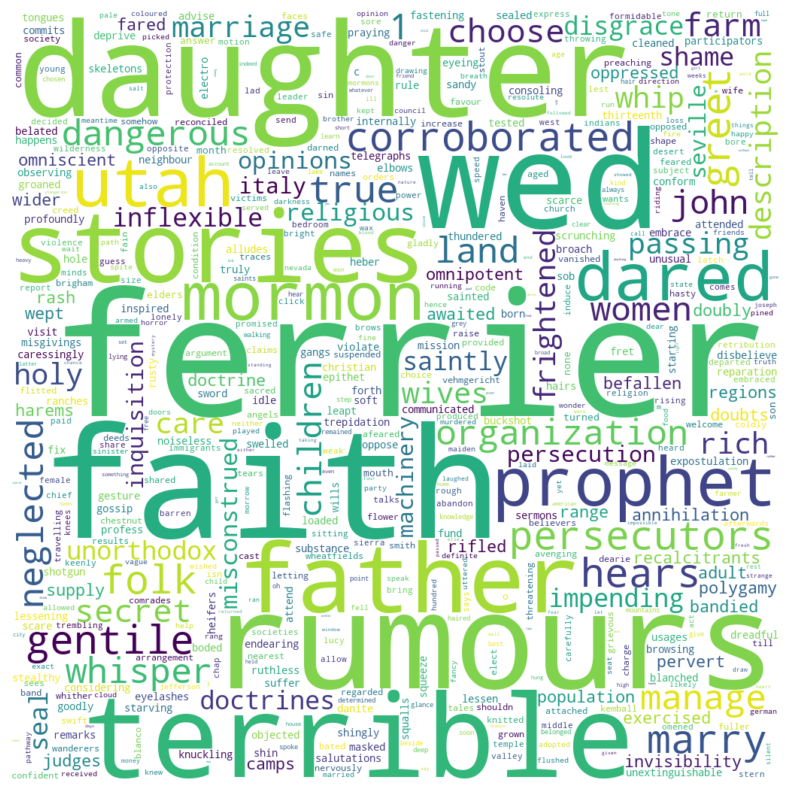

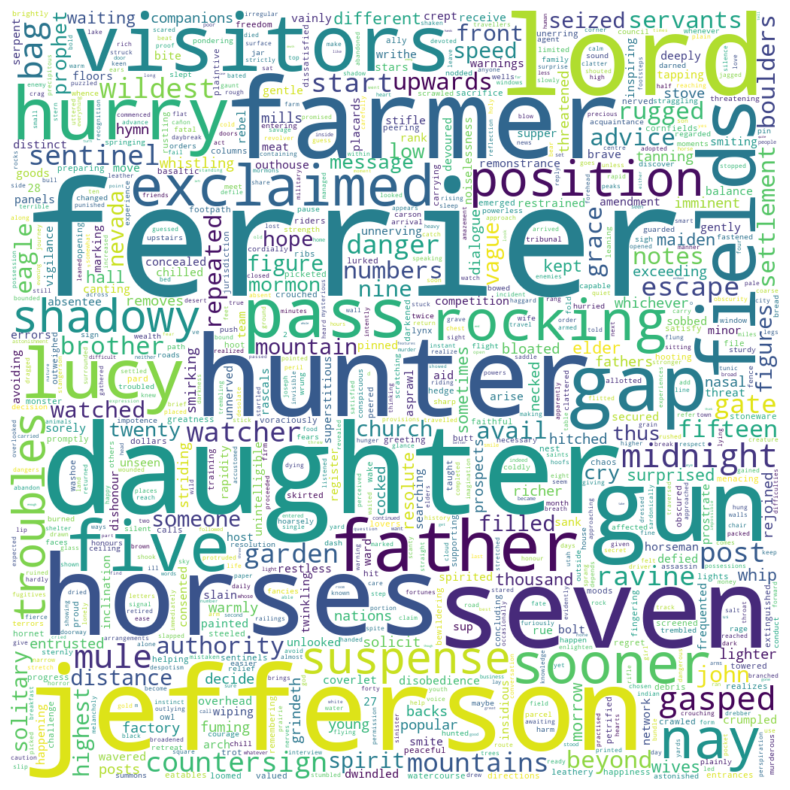

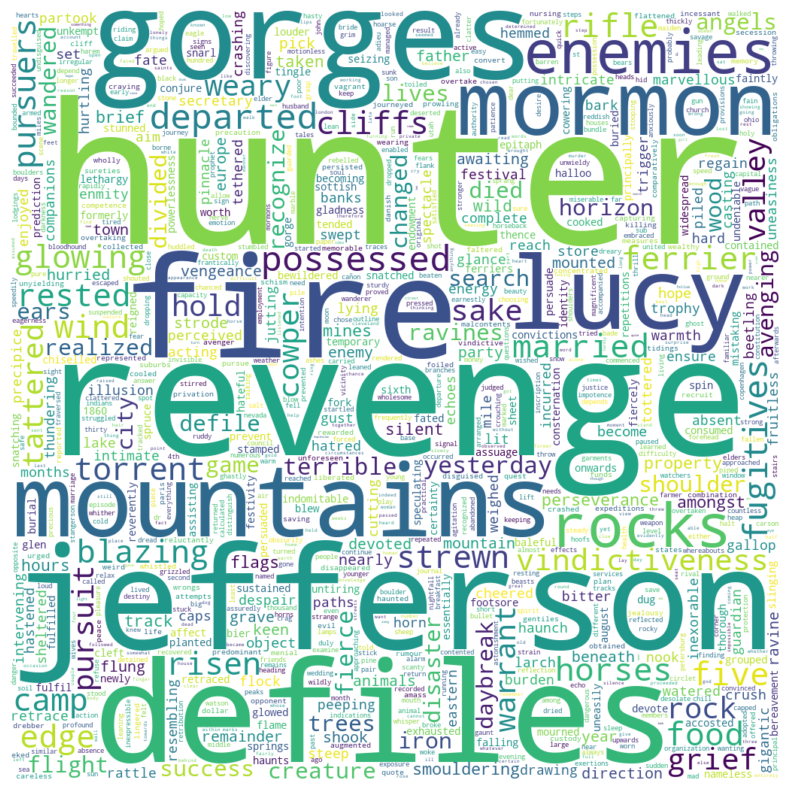

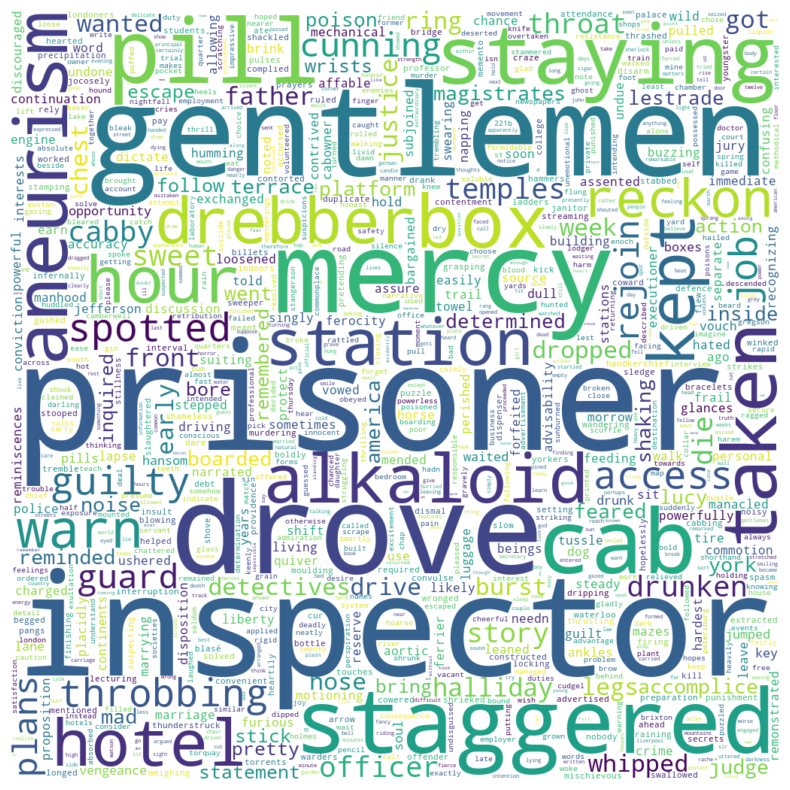

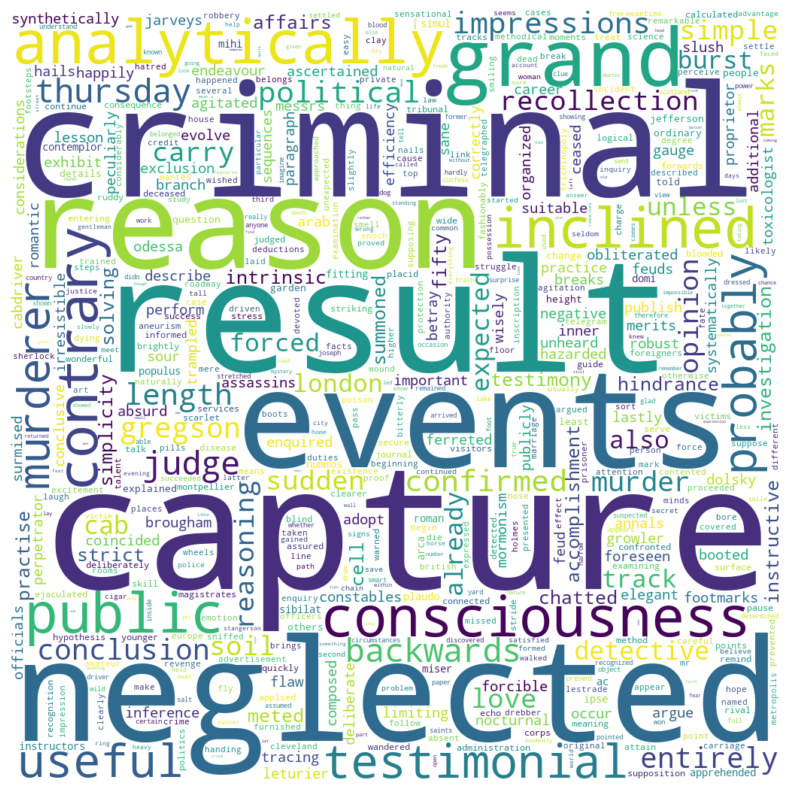

In [93]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

for i, doc in enumerate(documents_pairs):
    wc = WordCloud(width=1024, height=1024, background_color='white', max_words=1000).generate_from_frequencies(dict(doc))
    plt.figure(figsize=(10, 10))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.savefig(f'chapter_{i+1}_wordcloud6.png', format='png', dpi=300, bbox_inches='tight', pad_inches=0)